<a href="https://colab.research.google.com/github/aishamohamed/GAN-Benchmarck/blob/main/Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as T
import torch.optim as optim
import torch.nn.functional as F
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Running on:", device)

Running on: cuda


In [2]:
# Hyperparams
lr = 0.0002
beta1, beta2= 0.5, 0.999
real_label = 1.0
fake_label = 0.0
d_steps = 1
g_steps = 1
nz = 100
ngf, ndf = 64, 64
image_size = 64
batch_size = 64
n_epochs = 150


In [3]:
# DataLoader
data_root = "/content/drive/MyDrive/ISIC2017/by_class"


transform = T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),    # maps pixel → [–1,1]
])

# Build dataset object
full_ds = ImageFolder(data_root, transform=transform)

# get the integer label for "melanoma"
mel_idx = full_ds.class_to_idx['melanoma']

# pick only those indices whose label == mel_idx
mel_inds = [i for i, _ in enumerate(full_ds.targets) if full_ds.targets[i] == mel_idx]

# build a smaller dataset & loader
mel_ds = Subset(full_ds, mel_inds)

dataloader = DataLoader(
    mel_ds,
    batch_size=batch_size,  # how many images per step
    shuffle=True,           # randomize order each epoch
    num_workers=2)          # use 2 subprocesses to load data in parallel

print("Only melanoma—total images:", len(mel_ds))

Only melanoma—total images: 374


In [4]:
# Model definitions
#  Generator
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            # nz × 1 × 1 → ngf*8 × 4 × 4
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8), nn.ReLU(True),
            # → ngf*4 × 8 × 8
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4), nn.ReLU(True),
            # → ngf*2 × 16 × 16
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2), nn.ReLU(True),
            # → ngf × 32 × 32
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf), nn.ReLU(True),
            # → nc=3 × 64 × 64
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, x):
        return self.main(x)

#  Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            # 3 × 64 × 64 → ndf × 32 × 32
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # → ndf*2 × 16 × 16
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2, inplace=True),
            # → ndf*4 × 8 × 8
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2, inplace=True),
            # → ndf*8 × 4 × 4
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8), nn.LeakyReLU(0.2, inplace=True),
            # → 1 × 1 × 1
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.main(x).view(-1)

In [5]:
# Weight init as in DCGAN paper
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

G = Generator().to(device)
D = Discriminator().to(device)
G.apply(weights_init)
D.apply(weights_init)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [6]:
# Loss, Optimizers & fixed noise
criterion = nn.BCELoss()
optimizerD = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta1,beta2))
optimizerG = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta1,beta2))
fixed_noise = torch.randn(64, nz, 1, 1, device=device)


Epoch   1/150   Loss_D: 0.5758   Loss_G: 6.5295


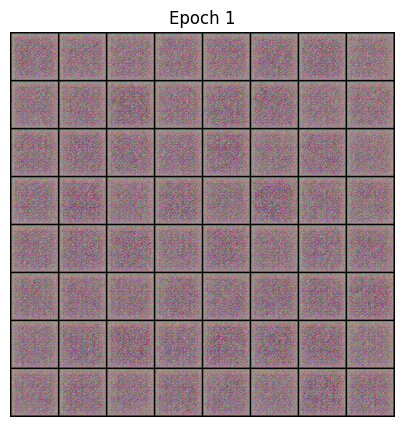

Epoch   2/150   Loss_D: 0.4097   Loss_G: 8.8908
Epoch   3/150   Loss_D: 0.3345   Loss_G: 9.8098
Epoch   4/150   Loss_D: 0.5915   Loss_G: 15.6510
Epoch   5/150   Loss_D: 0.6631   Loss_G: 16.7215


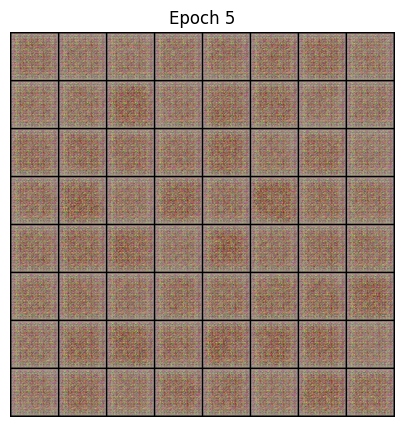

Epoch   6/150   Loss_D: 0.1703   Loss_G: 10.1458
Epoch   7/150   Loss_D: 0.3492   Loss_G: 18.0235
Epoch   8/150   Loss_D: 0.0680   Loss_G: 32.8037
Epoch   9/150   Loss_D: 0.0049   Loss_G: 31.1957
Epoch  10/150   Loss_D: 0.2690   Loss_G: 22.8275


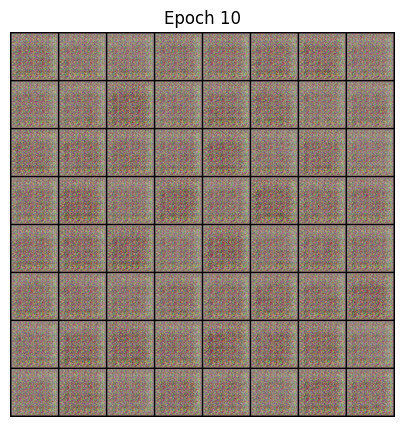

Epoch  11/150   Loss_D: 0.3765   Loss_G: 20.9573
Epoch  12/150   Loss_D: 0.0445   Loss_G: 29.0549
Epoch  13/150   Loss_D: 0.2014   Loss_G: 16.6686
Epoch  14/150   Loss_D: 1.6753   Loss_G: 15.9588
Epoch  15/150   Loss_D: 1.9392   Loss_G: 9.6258


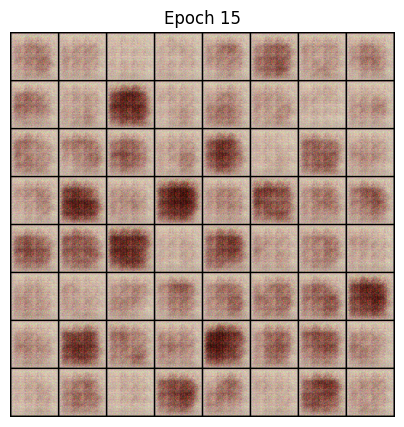

Epoch  16/150   Loss_D: 1.0472   Loss_G: 7.6277
Epoch  17/150   Loss_D: 0.4498   Loss_G: 5.1805
Epoch  18/150   Loss_D: 0.7061   Loss_G: 5.3328
Epoch  19/150   Loss_D: 0.4254   Loss_G: 5.6110
Epoch  20/150   Loss_D: 0.3696   Loss_G: 5.5950


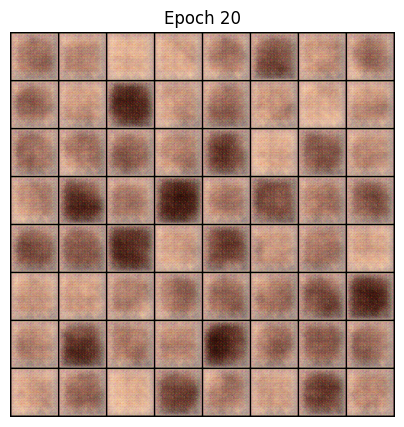

Epoch  21/150   Loss_D: 0.2533   Loss_G: 5.8341
Epoch  22/150   Loss_D: 0.2426   Loss_G: 6.8353
Epoch  23/150   Loss_D: 0.1699   Loss_G: 6.2824
Epoch  24/150   Loss_D: 0.1768   Loss_G: 7.0804
Epoch  25/150   Loss_D: 0.2148   Loss_G: 8.7983


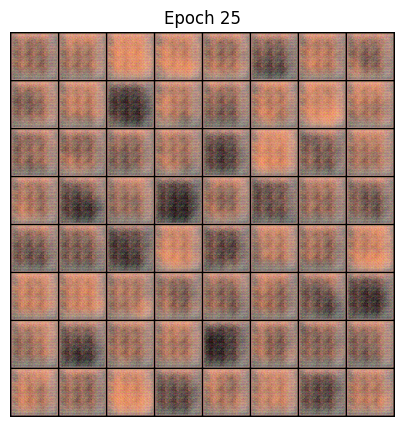

Epoch  26/150   Loss_D: 0.1949   Loss_G: 6.8658
Epoch  27/150   Loss_D: 0.2167   Loss_G: 9.4454
Epoch  28/150   Loss_D: 0.4755   Loss_G: 7.3786
Epoch  29/150   Loss_D: 0.2322   Loss_G: 6.0371
Epoch  30/150   Loss_D: 0.1235   Loss_G: 4.8078


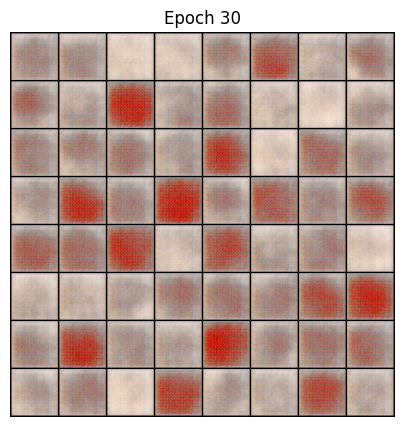

Epoch  31/150   Loss_D: 0.4446   Loss_G: 6.1823
Epoch  32/150   Loss_D: 0.3746   Loss_G: 6.3022
Epoch  33/150   Loss_D: 0.2805   Loss_G: 4.6942
Epoch  34/150   Loss_D: 2.0168   Loss_G: 9.9116
Epoch  35/150   Loss_D: 0.5090   Loss_G: 7.1705


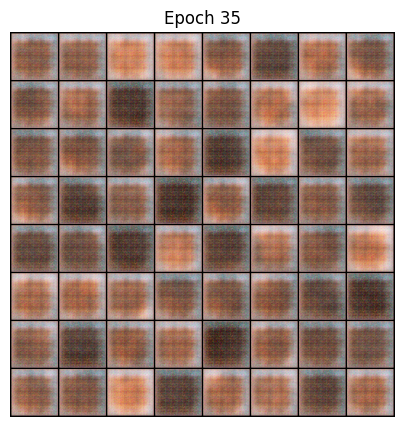

Epoch  36/150   Loss_D: 0.7040   Loss_G: 6.5532
Epoch  37/150   Loss_D: 0.7913   Loss_G: 6.8126
Epoch  38/150   Loss_D: 0.2186   Loss_G: 5.4394
Epoch  39/150   Loss_D: 0.2312   Loss_G: 5.8605
Epoch  40/150   Loss_D: 1.0711   Loss_G: 8.4460


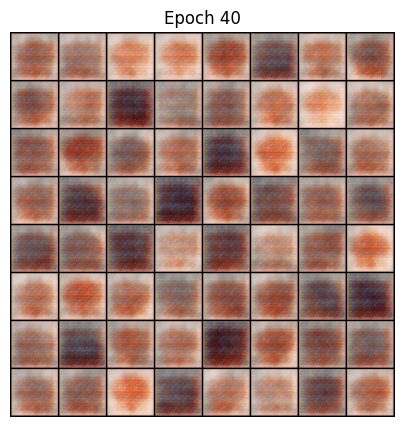

Epoch  41/150   Loss_D: 1.2527   Loss_G: 6.1266
Epoch  42/150   Loss_D: 0.6915   Loss_G: 4.3149
Epoch  43/150   Loss_D: 0.5390   Loss_G: 3.4186
Epoch  44/150   Loss_D: 0.8754   Loss_G: 3.7428
Epoch  45/150   Loss_D: 0.6085   Loss_G: 3.1636


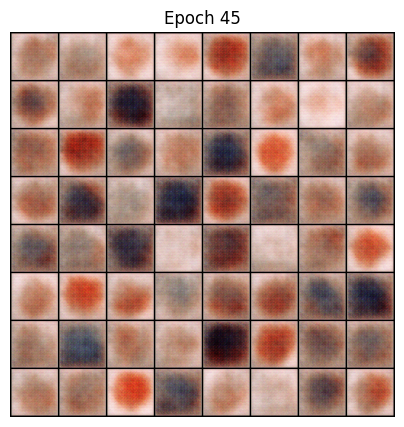

Epoch  46/150   Loss_D: 0.2975   Loss_G: 3.2914
Epoch  47/150   Loss_D: 0.3497   Loss_G: 3.1034
Epoch  48/150   Loss_D: 0.3897   Loss_G: 2.9605
Epoch  49/150   Loss_D: 0.4996   Loss_G: 3.7653
Epoch  50/150   Loss_D: 0.4867   Loss_G: 3.3547


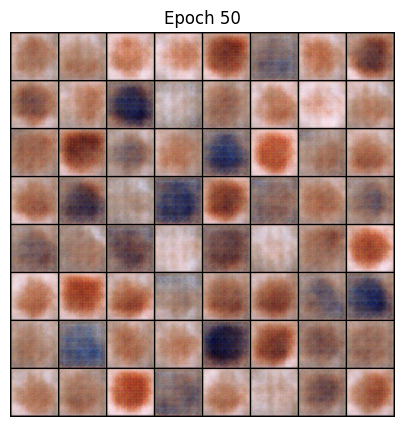

Epoch  51/150   Loss_D: 1.2897   Loss_G: 3.8469
Epoch  52/150   Loss_D: 0.6990   Loss_G: 3.8362
Epoch  53/150   Loss_D: 0.7104   Loss_G: 3.6662
Epoch  54/150   Loss_D: 0.5011   Loss_G: 3.7649
Epoch  55/150   Loss_D: 0.7754   Loss_G: 3.4966


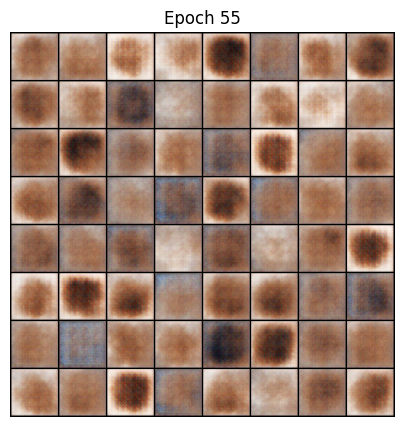

Epoch  56/150   Loss_D: 0.9244   Loss_G: 4.6483
Epoch  57/150   Loss_D: 0.5570   Loss_G: 4.2100
Epoch  58/150   Loss_D: 0.9063   Loss_G: 3.8343
Epoch  59/150   Loss_D: 0.6923   Loss_G: 4.5387
Epoch  60/150   Loss_D: 1.3554   Loss_G: 4.9289


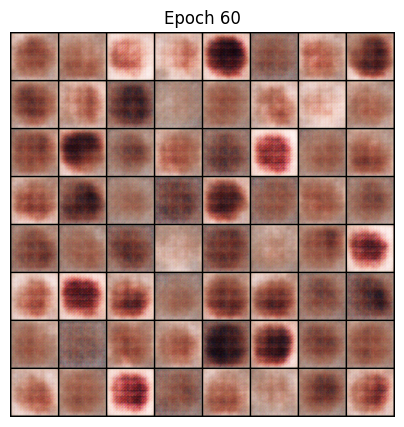

Epoch  61/150   Loss_D: 1.1240   Loss_G: 3.7821
Epoch  62/150   Loss_D: 0.5253   Loss_G: 3.0908
Epoch  63/150   Loss_D: 0.5222   Loss_G: 2.8650
Epoch  64/150   Loss_D: 0.7213   Loss_G: 3.1803
Epoch  65/150   Loss_D: 0.7072   Loss_G: 3.8444


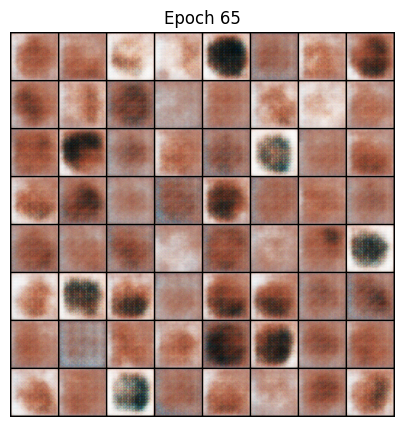

Epoch  66/150   Loss_D: 0.4361   Loss_G: 3.2837
Epoch  67/150   Loss_D: 0.4883   Loss_G: 3.6989
Epoch  68/150   Loss_D: 0.6768   Loss_G: 3.7864
Epoch  69/150   Loss_D: 0.5166   Loss_G: 3.6802
Epoch  70/150   Loss_D: 0.4795   Loss_G: 4.4025


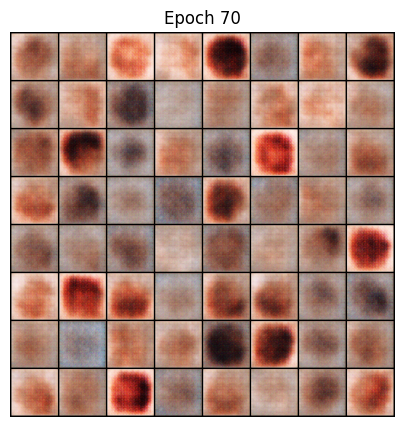

Epoch  71/150   Loss_D: 1.5987   Loss_G: 3.7333
Epoch  72/150   Loss_D: 0.5905   Loss_G: 3.4136
Epoch  73/150   Loss_D: 0.4691   Loss_G: 4.1390
Epoch  74/150   Loss_D: 0.3383   Loss_G: 4.0619
Epoch  75/150   Loss_D: 0.4622   Loss_G: 3.7692


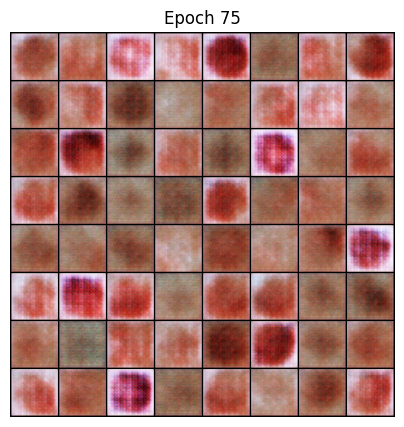

Epoch  76/150   Loss_D: 0.5106   Loss_G: 4.2309
Epoch  77/150   Loss_D: 0.4077   Loss_G: 4.3587
Epoch  78/150   Loss_D: 0.4897   Loss_G: 5.0924
Epoch  79/150   Loss_D: 0.7483   Loss_G: 4.0905
Epoch  80/150   Loss_D: 0.3598   Loss_G: 4.0139


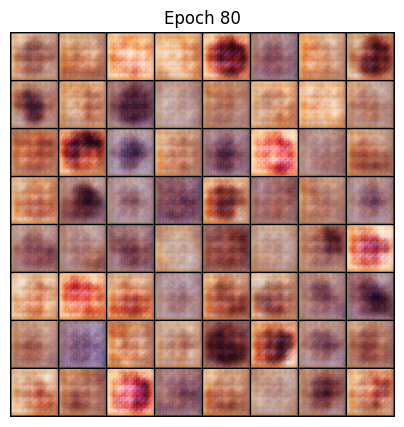

Epoch  81/150   Loss_D: 0.5607   Loss_G: 4.9129
Epoch  82/150   Loss_D: 0.9127   Loss_G: 4.3898
Epoch  83/150   Loss_D: 0.5630   Loss_G: 3.8343
Epoch  84/150   Loss_D: 0.4992   Loss_G: 3.7998
Epoch  85/150   Loss_D: 0.6255   Loss_G: 3.3424


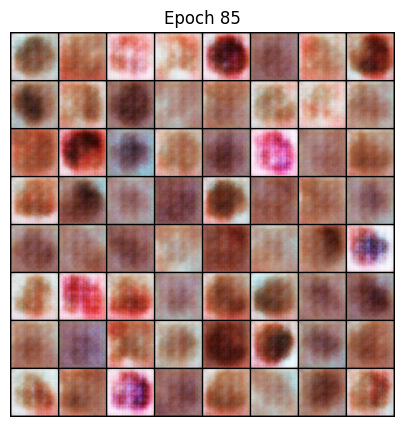

Epoch  86/150   Loss_D: 2.0959   Loss_G: 3.4352
Epoch  87/150   Loss_D: 1.0518   Loss_G: 2.5445
Epoch  88/150   Loss_D: 0.5147   Loss_G: 2.7784
Epoch  89/150   Loss_D: 0.6948   Loss_G: 2.7691
Epoch  90/150   Loss_D: 1.0015   Loss_G: 3.0677


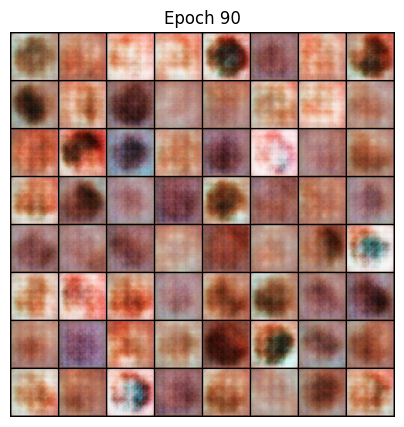

Epoch  91/150   Loss_D: 0.8854   Loss_G: 3.1914
Epoch  92/150   Loss_D: 0.7628   Loss_G: 2.3938
Epoch  93/150   Loss_D: 0.6208   Loss_G: 2.7855
Epoch  94/150   Loss_D: 0.4655   Loss_G: 2.8054
Epoch  95/150   Loss_D: 0.5975   Loss_G: 3.1011


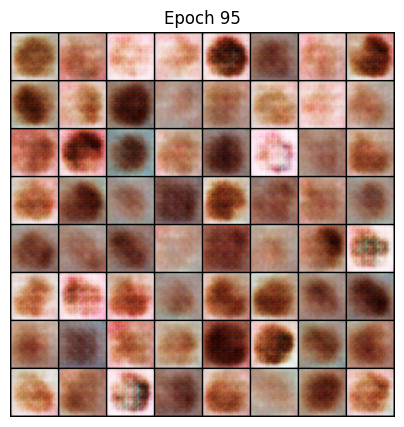

Epoch  96/150   Loss_D: 0.7333   Loss_G: 2.7360
Epoch  97/150   Loss_D: 0.7990   Loss_G: 2.9348
Epoch  98/150   Loss_D: 0.6403   Loss_G: 3.0991
Epoch  99/150   Loss_D: 0.7276   Loss_G: 2.5959
Epoch 100/150   Loss_D: 1.0078   Loss_G: 3.2588


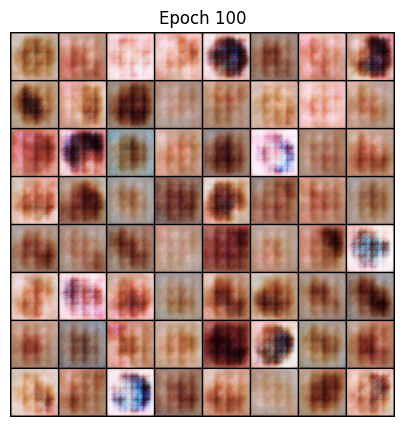

Epoch 101/150   Loss_D: 0.9604   Loss_G: 3.0408
Epoch 102/150   Loss_D: 0.8040   Loss_G: 2.7645
Epoch 103/150   Loss_D: 0.6850   Loss_G: 2.9919
Epoch 104/150   Loss_D: 0.5158   Loss_G: 3.0174
Epoch 105/150   Loss_D: 0.6181   Loss_G: 3.0970


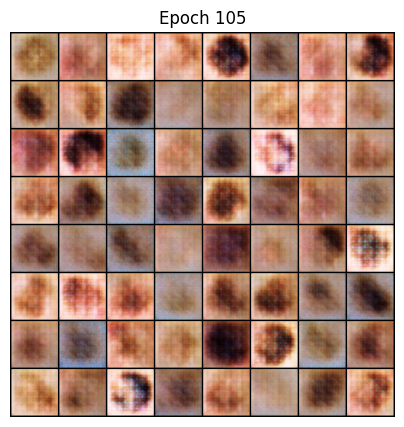

Epoch 106/150   Loss_D: 0.5613   Loss_G: 3.0187
Epoch 107/150   Loss_D: 0.6020   Loss_G: 3.3161
Epoch 108/150   Loss_D: 0.6863   Loss_G: 3.4116
Epoch 109/150   Loss_D: 0.8445   Loss_G: 3.4747
Epoch 110/150   Loss_D: 0.6241   Loss_G: 3.5500


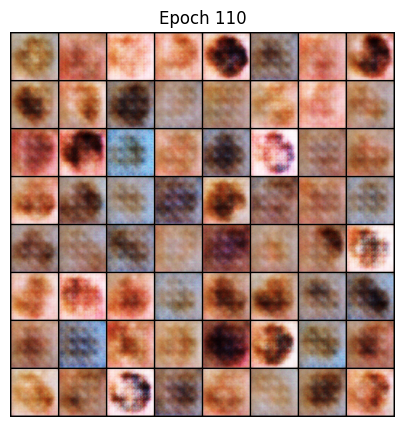

Epoch 111/150   Loss_D: 0.5606   Loss_G: 3.2477
Epoch 112/150   Loss_D: 0.4591   Loss_G: 3.3316
Epoch 113/150   Loss_D: 0.9014   Loss_G: 2.8797
Epoch 114/150   Loss_D: 0.7566   Loss_G: 3.0490
Epoch 115/150   Loss_D: 0.5221   Loss_G: 2.8166


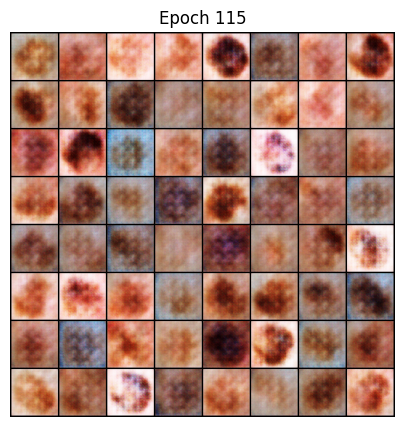

Epoch 116/150   Loss_D: 0.8304   Loss_G: 2.5590
Epoch 117/150   Loss_D: 0.5683   Loss_G: 3.0167
Epoch 118/150   Loss_D: 0.4488   Loss_G: 2.6484
Epoch 119/150   Loss_D: 0.4226   Loss_G: 2.9722
Epoch 120/150   Loss_D: 0.4759   Loss_G: 2.5728


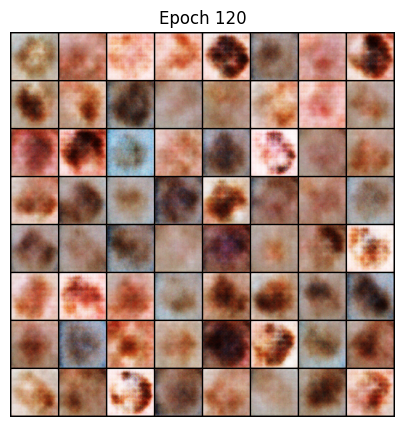

Epoch 121/150   Loss_D: 1.0693   Loss_G: 2.7345
Epoch 122/150   Loss_D: 0.7514   Loss_G: 2.9380
Epoch 123/150   Loss_D: 0.6026   Loss_G: 3.2561
Epoch 124/150   Loss_D: 0.5952   Loss_G: 2.8683
Epoch 125/150   Loss_D: 0.4039   Loss_G: 2.8638


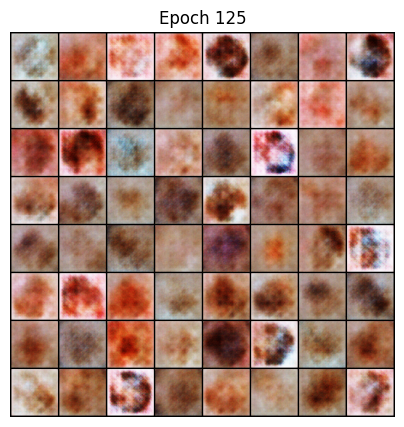

Epoch 126/150   Loss_D: 0.5644   Loss_G: 3.1848
Epoch 127/150   Loss_D: 0.6620   Loss_G: 2.8037
Epoch 128/150   Loss_D: 0.6122   Loss_G: 3.2375
Epoch 129/150   Loss_D: 0.5954   Loss_G: 2.8287
Epoch 130/150   Loss_D: 0.5011   Loss_G: 3.2546


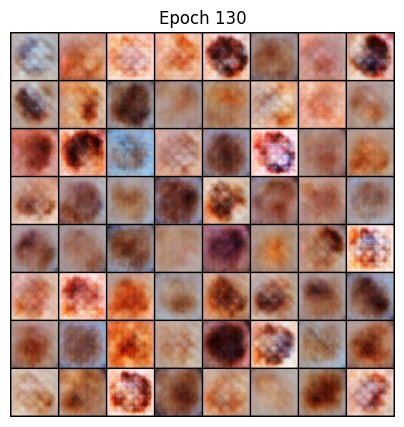

Epoch 131/150   Loss_D: 0.7179   Loss_G: 2.7239
Epoch 132/150   Loss_D: 0.4341   Loss_G: 3.0267
Epoch 133/150   Loss_D: 0.4338   Loss_G: 3.1178
Epoch 134/150   Loss_D: 0.3552   Loss_G: 3.2563
Epoch 135/150   Loss_D: 0.5147   Loss_G: 2.3206


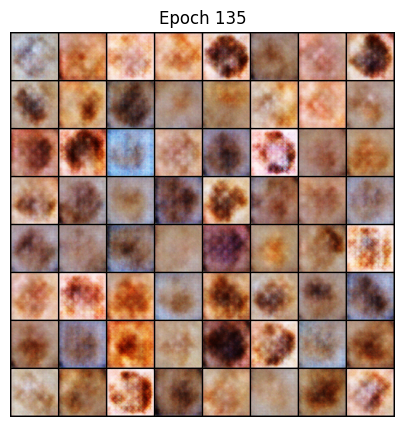

Epoch 136/150   Loss_D: 1.4939   Loss_G: 3.3410
Epoch 137/150   Loss_D: 0.8413   Loss_G: 2.6503
Epoch 138/150   Loss_D: 0.5706   Loss_G: 3.1117
Epoch 139/150   Loss_D: 0.6506   Loss_G: 3.1448
Epoch 140/150   Loss_D: 0.8183   Loss_G: 3.1816


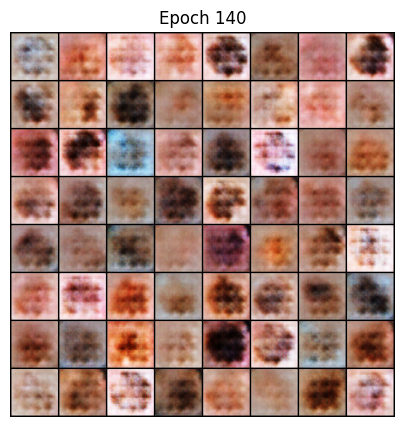

Epoch 141/150   Loss_D: 0.6068   Loss_G: 3.1097
Epoch 142/150   Loss_D: 0.6084   Loss_G: 3.0083
Epoch 143/150   Loss_D: 0.7225   Loss_G: 3.2104
Epoch 144/150   Loss_D: 0.5353   Loss_G: 3.5609
Epoch 145/150   Loss_D: 0.3545   Loss_G: 3.0944


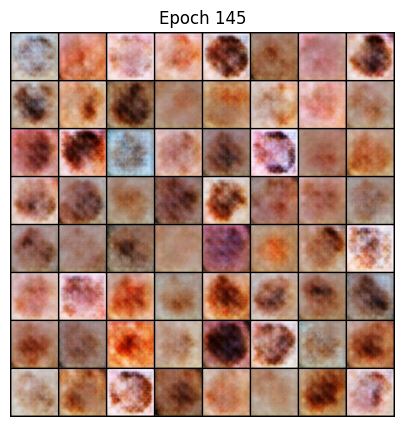

Epoch 146/150   Loss_D: 1.1393   Loss_G: 3.4656
Epoch 147/150   Loss_D: 0.8697   Loss_G: 3.0024
Epoch 148/150   Loss_D: 0.4409   Loss_G: 2.4989
Epoch 149/150   Loss_D: 0.5659   Loss_G: 2.9717
Epoch 150/150   Loss_D: 0.5423   Loss_G: 3.3863


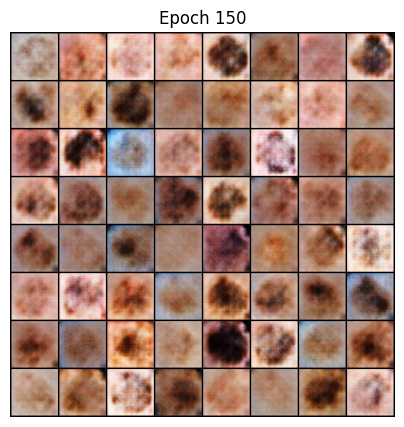

In [7]:
# Training loop & periodic visualization

# For each epoch
for epoch in range(1, n_epochs+1):
    runningD = 0.0
    runningG = 0.0
    batches  = 0

    for real_images, _ in dataloader:
        real_images = real_images.to(device)
        b_size      = real_images.size(0)
        batches    += 1

        # ——— D  ———
        lossD = 0.0
        for _ in range(d_steps):
            D.zero_grad()
            # real
            label_real = torch.full((b_size,), real_label, device=device)
            out_real   = D(real_images)
            lossD_real = criterion(out_real, label_real)

            # fake

            # Sample
            noise      = torch.randn(b_size, nz, 1, 1, device=device)
            fake_imgs  = G(noise).detach()
            label_fake = torch.full((b_size,), fake_label, device=device)
            out_fake   = D(fake_imgs)
            lossD_fake = criterion(out_fake, label_fake)

            lossD = lossD_real + lossD_fake
            lossD.backward()
            optimizerD.step()

        runningD += lossD.item()

        # ——— G  ———
        G.zero_grad()
        noise     = torch.randn(b_size, nz, 1, 1, device=device)
        fake_imgs = G(noise)
        label_G   = torch.full((b_size,), real_label, device=device)  # we want D(fake) → real
        outG      = D(fake_imgs)
        lossG     = criterion(outG, label_G)
        lossG.backward()
        optimizerG.step()

        runningG += lossG.item()

    # end of epoch: print avg losses
    avgD = runningD / batches
    avgG = runningG / batches
    print(f"Epoch {epoch:3d}/{n_epochs}   Loss_D: {avgD:.4f}   Loss_G: {avgG:.4f}")

    # every 5 epochs (and epoch 1), show samples
    if epoch == 1 or epoch % 5 == 0:
        with torch.no_grad():
            samples = G(fixed_noise).cpu()
        grid = vutils.make_grid(samples, normalize=True, nrow=8, padding=2)
        plt.figure(figsize=(5,5))
        plt.axis('off')
        plt.title(f"Epoch {epoch}")
        plt.imshow(np.transpose(grid, (1,2,0)))
        plt.show()


In [9]:
# save G
torch.save(G.state_dict(), "dcgan_generator_final.pth")
print("Generator saved.")


Generator saved.


In [12]:
from google.colab import files

files.download("dcgan_generator_final.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>